In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from scipy.stats import mstats
import re
import os
import matplotlib.pyplot as plt
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator
import matplotlib as mpl
%matplotlib inline
from itertools import chain
from collections import Counter
from PIL import Image
np.random.seed(19680801)
import matplotlib.mlab as mlab
import pylab
from pylab import xticks

In [11]:
df_jobs = pd.read_csv("Combined_data_jobs_final.csv")
df_salary = pd.read_csv("Salary_combined_alldata.csv")

In [3]:
#checking the dataframe shape, removing empty rows

In [10]:
df_jobs.shape
df_jobs = df_jobs.loc[~df_jobs['title'].isna()]
df_jobs.shape

(19751, 8)

In [12]:
df_salary.shape
df_salary1 = df_salary.loc[~df_jobs['title'].isna()]
df_salary1.shape

(9932, 5)

In [13]:
df_jobs.groupby('job_category').count()


,title,company,summary,location,experience,city,state
job_category,,,,,,,
Business Analyst,8771,8774,8774,8774,7120,8774,8768
Data Analyst,4736,4737,4736,4737,4248,4737,4725
Data Engineer,2599,2599,2599,2599,2548,2599,2586
Data Scientist,3645,3645,3644,3645,3531,3645,3629


In [15]:
df_salary.groupby('job_category').count()

,title,Avg_salary,State,salary_year
job_category,,,,
Business Analyst,4547,4547,4547,4547
Data Analyst,2852,2852,2852,2852
Data Engineer,1065,1065,1065,1065
Data Scientist,1471,1471,1471,1471


In [14]:
df_jobs.head(5)


,title,company,summary,location,experience,job_category,city,state
0,NAS Business Analyst Intern,Aloha Air Cargo,Business Analyst Intern must be a self-starte...,"Anchorage, AK",Office,Business Analyst,Anchorage,AK
1,Compliance Data Analyst,University of Alaska,Data management programming necessary data ...,"Anchorage, AK",Ellucian,Data Analyst,Anchorage,AK
2,Junior Business Analyst,Yukon-Kuskokwim Health oration,Business Analyst - Junior position requires ...,"Bethel, AK",NaN,Business Analyst,Bethel,AK
3,Data Analyst,Kakivik Asset Management,Experience as a . This role be responsible a...,"Anchorage, AK 99503 (Midtown area)",NaN,Data Analyst,Anchorage,AK
4,Part-Time Data Analyst Intern,Ogletree Deakins,"Our Birmingham, AL fice has an opportunity a ...","Birmingham, AL","Excel, Office",Data Analyst,Birmingham,AL


In [ ]:
df_salary.head(5)

In [16]:
#making df for each job category
df_jobs_BA = df_jobs.loc[df_jobs['job_category'] == 'Business Analyst']
df_jobs_DA = df_jobs.loc[df_jobs['job_category'] == 'Data Analyst']
df_jobs_DE = df_jobs.loc[df_jobs['job_category'] == 'Data Engineer']
df_jobs_DS = df_jobs.loc[df_jobs['job_category'] == 'Data Scientist']

In [17]:
df_jobs_BA = df_jobs_BA.loc[~df_jobs_BA['experience'].isna()]
df_jobs_DA = df_jobs_DA.loc[~df_jobs_DA['experience'].isna()]
df_jobs_DE = df_jobs_DE.loc[~df_jobs_DE['experience'].isna()]
df_jobs_DS = df_jobs_DS.loc[~df_jobs_DS['experience'].isna()]

In [ ]:
df_jobs_BA.shape

In [ ]:
df_jobs_DE.shape

In [ ]:
df_jobs_DA.shape

In [ ]:
df_jobs_DS.shape

In [ ]:
#creating word cloud for Business Analyst job skills

In [97]:
wcba = WordCloud(background_color="white", max_words=500)
# generate word cloud
wcba.generate(''.join(df_jobs_BA['experience']))

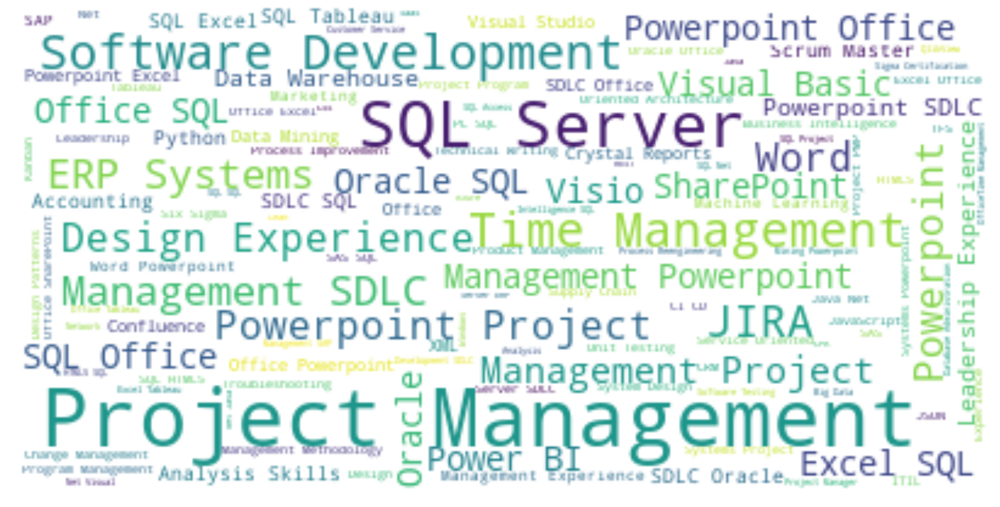

In [98]:
# show
plt.figure(figsize=(30, 15))
plt.imshow(wcba, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [ ]:
#creating world cloud for Data Analyst job skills

In [21]:
wcda = WordCloud(background_color="white", max_words=500,max_font_size=25)
# generate word cloud
wcda.generate(''.join(df_jobs_DA['experience']))

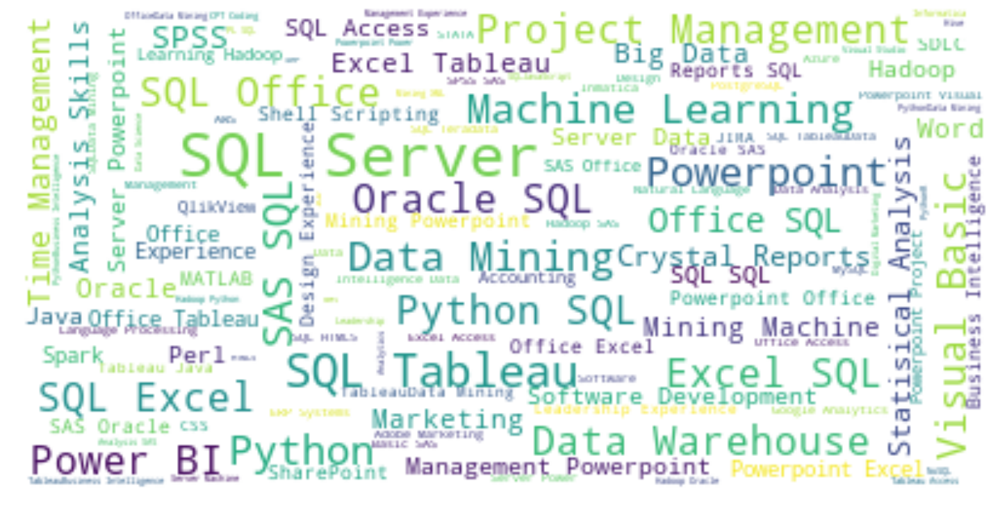

In [22]:
plt.figure(figsize=(25, 15))
plt.imshow(wcda, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [23]:
 #creating word cloud for Data Engineer job skills

In [24]:
df_jobs_DE = df_jobs_DE.loc[~df_jobs_DE['experience'].isna()]# removing Nan in the experience column

In [25]:
wcde = WordCloud(background_color="white", max_words=500, max_font_size=25)
# generate word cloud
wcde.generate(''.join(df_jobs_DE['experience']))

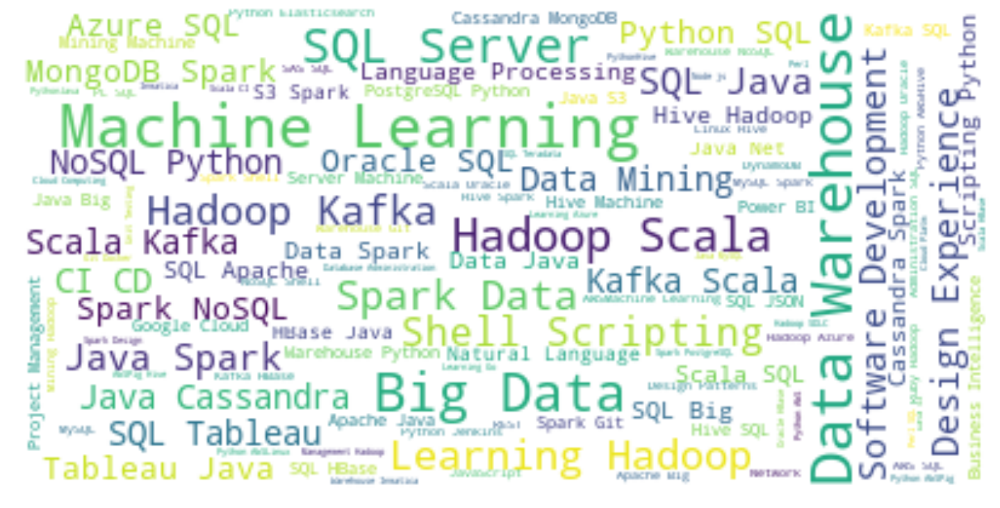

In [26]:
plt.figure(figsize=(25, 15))
plt.imshow(wcde, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [ ]:
#creating word cloud for Data Science jobs

In [30]:
df_jobs_DS = df_jobs_DS.loc[~df_jobs_DS['experience'].isna()]

In [31]:
wcds = WordCloud(background_color="white", max_words=500, max_font_size=25)
# generate word cloud
wcds.generate(''.join(df_jobs_DS['experience']))

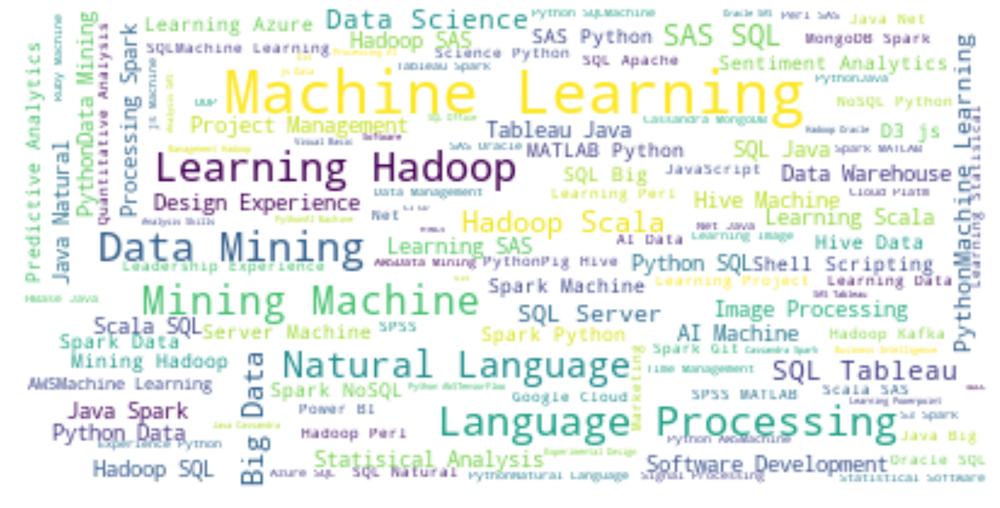

In [32]:
plt.figure(figsize=(25, 15))
plt.imshow(wcds, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [33]:
len(list(filter(lambda s: s.find('SQL')>=0, df_jobs_BA['experience']))) #  finding list of specific skill

2224

In [34]:
df_jobs_BA['experience']#visualizing 

0                                                   Office
9                               Office, Excel, Java,  Word
11                                                  Office
16                                              Accounting
17                                       Time Management, 
24                                 Business Intelligence, 
29       SAS, SQL,  Office, SharePoint, Design Experien...
30       TFS, Hadoop, SDLC, SQL, Big Data, HP ALM, Desi...
31       SQL, Big Data, Design Experience,  Leadership ...
32                                           Salesce CRM, 
35       IIS,  SQL Server, PowerShell, Azure, CI/CD, SQ...
38                                             Oracle, SQL
39                                              Powerpoint
40       .Net, Certified Scrum Master,  Powerpoint, TFS...
41                        Axure, SQL, Balsamiq, VersionOne
43                                   SOX, PMP, PCI, CAPM, 
46                                      Project Manageme

In [35]:
list(map(lambda s: s.split(', '), df_jobs_BA['experience'])) # spliting column into a list wiht nested list

[[' Office'],
 [' Office', 'Excel', 'Java', ' Word'],
 ['  Office'],
 ['Accounting'],
 ['Time Management', ''],
 ['Business Intelligence', ''],
 ['SAS',
  'SQL',
  ' Office',
  'SharePoint',
  'Design Experience',
  'Military Experience'],
 ['TFS',
  'Hadoop',
  'SDLC',
  'SQL',
  'Big Data',
  'HP ALM',
  'Design Experience',
  '  Military Experience',
  'VersionOne'],
 ['SQL',
  'Big Data',
  'Design Experience',
  ' Leadership Experience',
  'Military Experience',
  'TFS',
  'Hadoop',
  'SDLC',
  'HP ALM',
  ' VersionOne'],
 ['Salesce CRM', ''],
 ['IIS',
  ' SQL Server',
  'PowerShell',
  'Azure',
  'CI/CD',
  'SQL',
  'Customer Service',
  'T-SQL',
  ''],
 ['Oracle', 'SQL'],
 [' Powerpoint'],
 ['.Net',
  'Certified Scrum Master',
  ' Powerpoint',
  'TFS',
  'Software Development',
  'SDLC',
  ' Office'],
 ['Axure', 'SQL', 'Balsamiq', 'VersionOne'],
 ['SOX', 'PMP', 'PCI', 'CAPM', ''],
 ['Project Management'],
 ['Salesce CRM', ' Word', ' Powerpoint', 'SDLC'],
 ['ERP Systems', 'SQL'],

In [36]:
list_experience_BA = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_BA['experience']))))

In [37]:
c1 = Counter(list_experience_BA)
c2 = c1.most_common(20)
c3 = c2.remove(('', 1015)) 
print(c2)

[('SQL', 1765), (' Office', 1493), (' Powerpoint', 1409), ('SDLC', 1185), ('Project Management', 1025), ('Excel', 764), ('Oracle', 687), ('Time Management', 544), (' SQL Server', 533), ('Tableau', 513), ('SharePoint', 468), ('Software Development', 404), ('ERP Systems', 385), ('JIRA', 378), ('Java', 361), (' Word', 318), ('PMP', 308), ('HTML5', 291), ('.Net', 284)]


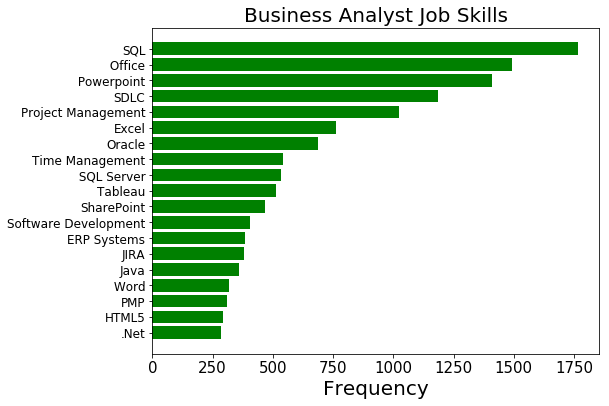

In [38]:
fig, ax = plt.subplots(figsize=(8, 6))# width:10, height:8
ax.barh(list(map(lambda t:t[0],c2)), list(map(lambda t:t[1],c2)), color='green')
ax.invert_yaxis()
ax.set_xlabel('Frequency', size = 20)
ax.set_title('Business Analyst Job Skills', size = 20)
plt.xticks(size = 15)
plt.yticks(size = 12)
fig.savefig('BA_skills.png', dpi=500,bbox_inches = 'tight')
plt.show()

In [40]:
len(list(filter(lambda s: s.find('SQL')>=0, df_jobs_DA['experience']))) #count number of particular skills

2405

In [41]:
df_jobs_DA['experience'] # visualize the column containing skills

1                                                 Ellucian
4                                           Excel,  Office
5                                                    Excel
6                     Business Intelligence, R, SAS, Excel
7                                MATLAB, Signal Processing
18                                                     SAS
19        SQL Server, Data Mining, Project Management, ...
20       Customer Segmentation, Marketing, SAS, SQL, SP...
23                  Powerpoint, Medical Terminology, Excel
27                                Time Management,  Office
36             Hive, Quantitative Analysis, R, Python, SQL
42       XML, Perl, SQL, JSON, .Net, Java, T-SQL, MySQL...
44       Hive, Hadoop, SQL, Tableau, Big Data, MySQL, S...
55                                              SAS, Excel
124                                              SQL, SPSS
125      R, Excel, SQL, SPSS, Leadership Experience, SA...
126                            Data Mining, SDLC, SAS, S

In [42]:
list(map(lambda s: s.split(', '), df_jobs_DA['experience'])) # converting the lis tin each row inot one nested list
list_experience_DA = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_DA['experience'])))) 
list_experience_DA

['Ellucian',
 'Excel',
 ' Office',
 'Excel',
 'Business Intelligence',
 'R',
 'SAS',
 'Excel',
 'MATLAB',
 'Signal Processing',
 'SAS',
 ' SQL Server',
 'Data Mining',
 'Project Management',
 'SQL',
 ' Access',
 'Customer Segmentation',
 'Marketing',
 'SAS',
 'SQL',
 'SPSS',
 'Data Analysis',
 ' Powerpoint',
 'Medical Terminology',
 'Excel',
 'Time Management',
 ' Office',
 'Hive',
 'Quantitative Analysis',
 'R',
 'Python',
 'SQL',
 'XML',
 'Perl',
 'SQL',
 'JSON',
 '.Net',
 'Java',
 'T-SQL',
 'MySQL',
 'C#',
 'REST',
 'Python',
 'PHP',
 'Hive',
 'Hadoop',
 'SQL',
 'Tableau',
 'Big Data',
 'MySQL',
 'Spark',
 'Data Warehouse',
 'Git',
 ' PostgreSQL',
 'JIRA',
 'AWS',
 'SAS',
 'Excel',
 'SQL',
 'SPSS',
 'R',
 'Excel',
 'SQL',
 'SPSS',
 'Leadership Experience',
 'SAS',
 ' Office',
 'Tableau',
 'Data Mining',
 'SDLC',
 'SAS',
 'SQL',
 ' SQL Server',
 'SQL',
 'Visual Studio',
 'Data Warehouse',
 'Data Mining',
 'R',
 'SAS',
 'SQL',
 'Tableau',
 'Time Management',
 'Data Mining',
 ' SQL Ser

In [43]:
cda = Counter(list_experience_DA)
cda3 = cda.most_common(20)
print(cda3)

[('SQL', 2137), ('Tableau', 1020), (' Office', 816), ('Excel', 788), ('Python', 781), ('R', 776), (' Powerpoint', 665), ('SAS', 620), (' SQL Server', 548), ('Data Mining', 529), ('Oracle', 426), ('Machine Learning', 352), (' Access', 342), ('Hadoop', 267), ('Data Warehouse', 243), ('SPSS', 242), ('Business Intelligence', 221), ('Visual Basic', 220), ('Project Management', 219), ('Java', 219)]


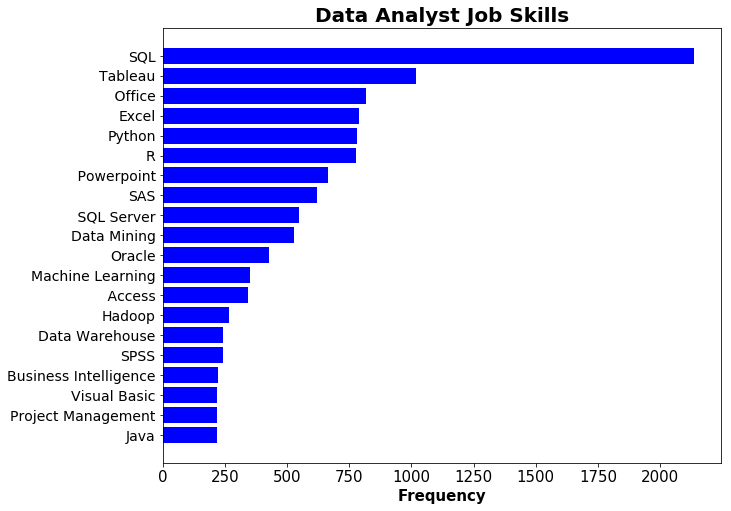

In [44]:
fig, ax = plt.subplots(figsize=(10,8))# width:10, height:8
ax.barh(list(map(lambda t:t[0],cda3)), list(map(lambda t:t[1],cda3)), color='blue')
ax.invert_yaxis()
ax.set_xlabel('Frequency', size = 15,fontweight='bold')
ax.set_title('Data Analyst Job Skills', size = 20,fontweight='bold')
plt.xticks(size = 15)
plt.yticks(size = 14)
fig.savefig('DA_skills.png', dpi=500,bbox_inches = 'tight')
plt.show()

In [45]:
#creating horizontal barchart for Data engineer skills

In [46]:
list(map(lambda s: s.split(', '), df_jobs_DE['experience'])) # converting the lis tin each row inot one nested list

[['Linux',
  ' SQL Server',
  'Project Management',
  'Oracle',
  'SQL',
  'Troubleshooting',
  'Inmatica'],
 ['Business Process Reengineering',
  'Kafka',
  'LDAP',
  'SQL',
  'Tableau',
  'Apache',
  'Spark',
  'NoSQL',
  'Adobe Marketing',
  'Elasticsearch'],
 [' SQL Server',
  'OBIEE',
  'Machine Learning',
  'Power BI',
  'R',
  'Azure',
  'SQL',
  'Apache',
  'PL/SQL',
  'Quality Management',
  'Hadoop',
  'Kafka',
  'Oracle',
  ' Office',
  'Tableau',
  'Cassandra',
  'MongoDB',
  'Spark',
  'Data Warehouse',
  'REST'],
 ['Java',
  'Spark',
  'Machine Learning',
  'Data Warehouse',
  'Hadoop',
  'Kafka',
  'Python'],
 ['Spark', 'Scala'],
 ['Java',
  'Data Mining',
  'Selenium',
  'REST',
  'Eclipse',
  'SQL',
  'DB2',
  'Groovy'],
 ['Database Administration',
  ' SQL Server',
  'SDLC',
  'Oracle',
  'HBase',
  'SQL',
  'Cassandra',
  'MongoDB',
  'Design Experience',
  'PostgreSQL',
  'NoSQL',
  'DB2'],
 ['JavaScript',
  'Hadoop',
  'SDLC',
  'SQL',
  'Java',
  'Big Data',
  'Da

In [47]:
list_experience_DE = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_DE['experience']))))#unpacking the nested list

In [109]:
cde = Counter(list_experience_DE)
cde3 = cde.most_common(20)
print(cde3)

[('Python', 1540), ('SQL', 1452), ('Hadoop', 1293), ('Spark', 1205), ('Java', 1137), ('AWS', 879), ('Scala', 751), ('Machine Learning', 735), ('Hive', 719), ('Kafka', 611), ('NoSQL', 580), ('Data Warehouse', 555), ('Big Data', 509), ('R', 483), ('Tableau', 400), ('Linux', 372), (' SQL Server', 370), ('Oracle', 342), ('HBase', 338), ('Azure', 333)]


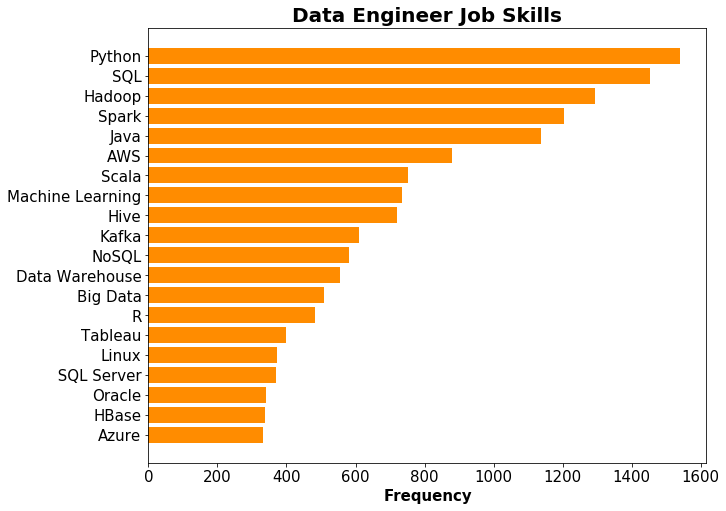

In [49]:
fig, ax = plt.subplots(figsize=(10,8))# width:10, height:8
ax.barh(list(map(lambda t:t[0],cde3)), list(map(lambda t:t[1],cde3)), color='darkorange')
ax.invert_yaxis()
ax.set_xlabel('Frequency', size = 15, fontweight='bold')
ax.set_title('Data Engineer Job Skills', size = 20, fontweight='bold')
plt.xticks(size = 15)
plt.yticks(size = 15)
fig.savefig('DE_skills.png', dpi=500,bbox_inches = 'tight')
plt.show()

In [50]:
list(map(lambda s: s.split(', '), df_jobs_DS['experience'])) # converting the lis tin each row inot one nested list

[['Data Mining'],
 ['Data Mining', 'Machine Learning', 'SPSS', 'R', 'SAS', 'Data Science'],
 [' SQL Server',
  'Data Mining',
  'Marketing',
  'R',
  'Oracle',
  'SAS',
  'SQL',
  'Big Data',
  'DB2'],
 [' SQL Server', 'Data Mining', 'R', 'Oracle', 'SAS', 'SQL', 'DB2'],
 ['Machine Learning', ' R', 'Python'],
 ['SDLC'],
 ['Machine Learning', 'SPSS', 'R', 'SAS', 'Python', 'Tableau'],
 ['Ruby',
  'Machine Learning',
  'Perl',
  'Scala',
  'R',
  'Java',
  'Natural Language Processing',
  'SPSS',
  'Python'],
 ['Machine Learning',
  'Power BI',
  'R',
  'Statisical Analysis',
  'SAS',
  'SQL',
  'Tableau',
  'Data Warehouse',
  "Driver's License",
  'Python'],
 ['Java', 'Machine Learning', 'Hadoop', 'Python'],
 ['Hive',
  'Data Mining',
  ' SQL Server',
  'Machine Learning',
  'Hadoop',
  'R',
  'Statisical Analysis',
  'S3',
  'Spark',
  'PostgreSQL',
  'IVR',
  'Data Science',
  'Python',
  'JIRA',
  'Elasticsearch'],
 ['Instructional Design', 'Python'],
 ['Machine Learning',
  'Project 

In [51]:
list_experience_DS = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_DS['experience']))))#unpacking the nested list

In [52]:
cds = Counter(list_experience_DS)
cds3 = cds.most_common(20)
print(cds3)

[('Python', 2500), ('Machine Learning', 2460), ('R', 2073), ('SQL', 1808), ('Hadoop', 1183), ('Spark', 996), ('Data Mining', 965), ('Java', 963), ('SAS', 802), ('Tableau', 645), ('Natural Language Processing', 642), ('Hive', 629), ('Scala', 558), ('C/C++', 510), ('AWS', 485), ('AI', 450), ('MATLAB', 450), ('TensorFlow', 414), ('Big Data', 362), ('NoSQL', 336)]


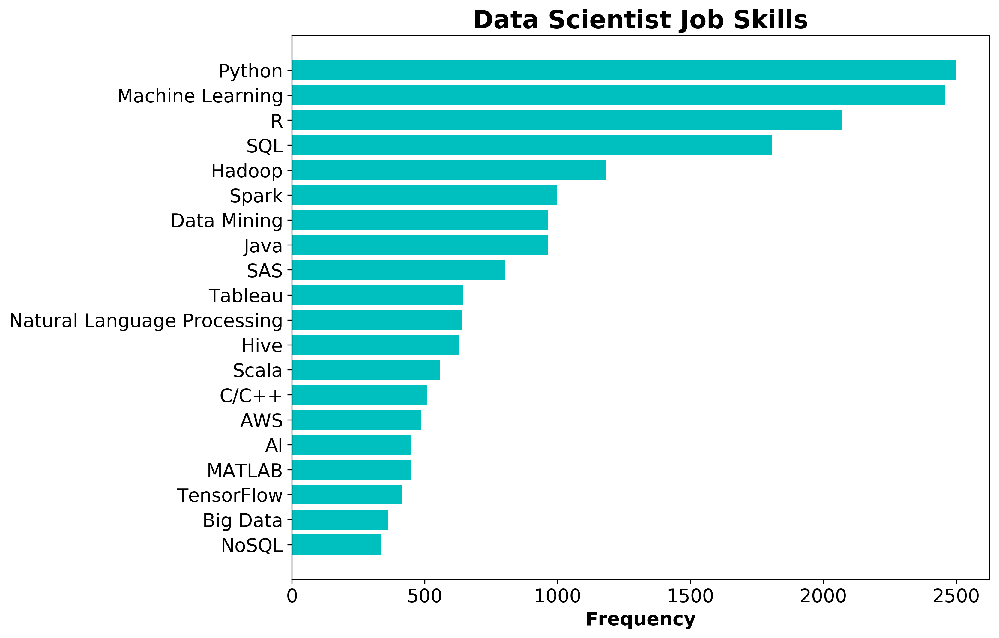

In [53]:
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
ax.barh(list(map(lambda t:t[0],cds3)), list(map(lambda t:t[1],cds3)), color='c')
ax.invert_yaxis()
ax.set_xlabel('Frequency', size = 15,fontweight='bold')
ax.set_title('Data Scientist Job Skills', size = 20,fontweight='bold')
plt.xticks(size = 15)
plt.yticks(size = 15)
fig.savefig('DS_skills.png', dpi=500, bbox_inches = 'tight')
plt.show()

In [ ]:
#Making word cloud for employers

In [55]:
df_jobs_BA_com = df_jobs_BA.loc[~df_jobs_BA['company'].isna()]# removing Nan in the experience column

In [107]:
wcbacom = WordCloud(background_color="black", max_words=500, max_font_size=20)
# generate word cloud
wcbacom.generate(''.join(df_jobs_BA_com['company']))

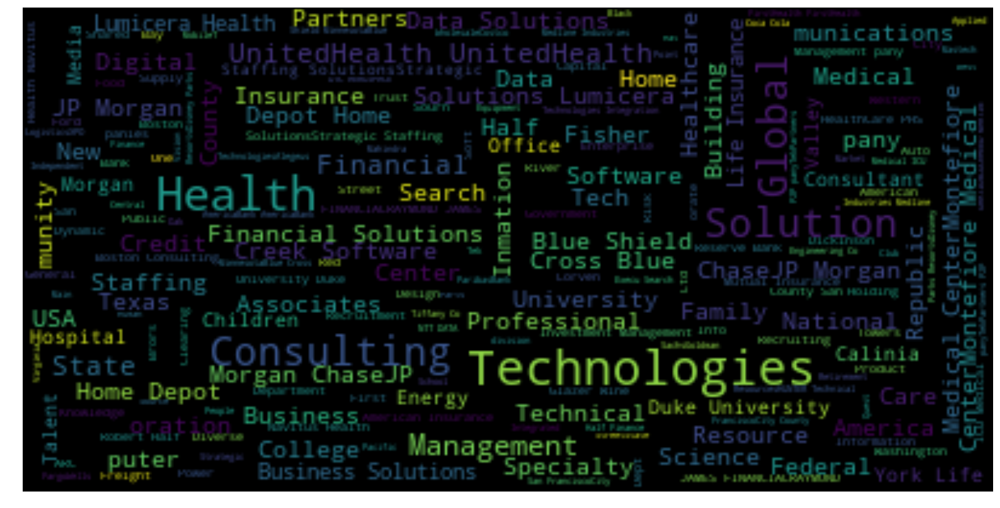

In [108]:
plt.figure(figsize=(20, 15))
plt.imshow(wcbacom, interpolation='bilinear')
plt.axis("off")
plt.tight_layout(pad=0)
#fig.savefig('Worldcloud_BA_employers.png', dpi=500, bbox_inches = 'tight')
plt.show()

In [104]:
df_jobs_DA_com = df_jobs_DA.loc[~df_jobs_DA['company'].isna()]# removing Nan in the experience column


In [105]:
wcdacom = WordCloud(background_color="black", max_words=500,max_font_size=35)
# generate word cloud
wcdacom.generate(''.join(df_jobs_DA_com['company']))

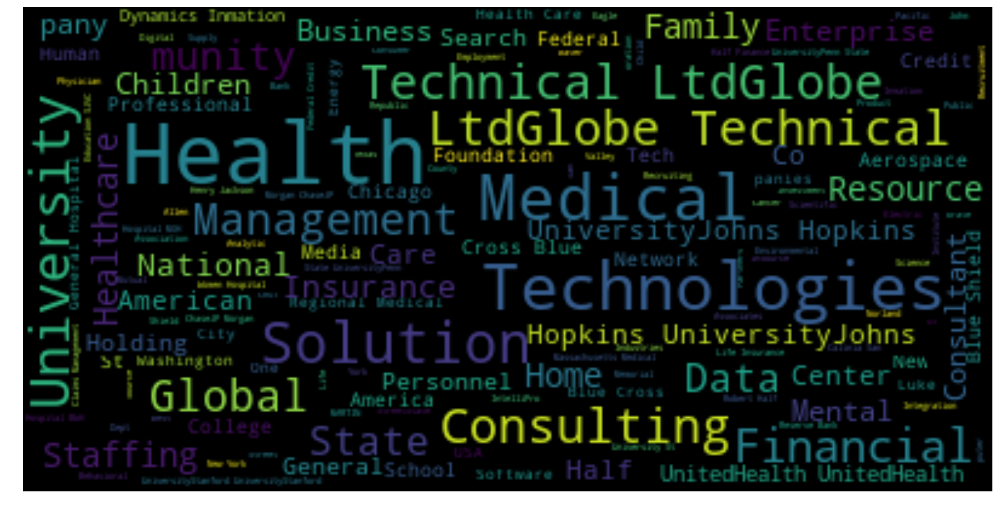

In [106]:
plt.figure(figsize=(25, 15))
plt.imshow(wcdacom, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [62]:
df_jobs_DE_com = df_jobs_DE.loc[~df_jobs_DE['company'].isna()]# removing Nan in the experience column

In [63]:
wcdecom = WordCloud(background_color="black", max_words=500, max_font_size=35)
# generate word cloud
wcdecom.generate(''.join(df_jobs_DE_com['company']))

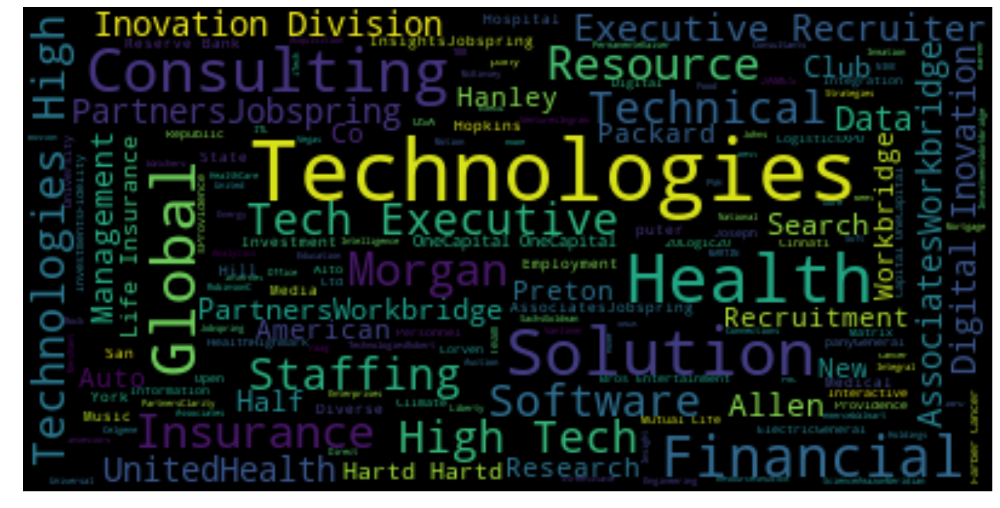

In [64]:
plt.figure(figsize=(25, 15))
plt.imshow(wcdecom, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [101]:
df_jobs_DS_com = df_jobs_DS.loc[~df_jobs_DS['company'].isna()]# removing Nan in the experience column

In [102]:
wcdscom = WordCloud(background_color="black", max_words=500, max_font_size=35)
# generate word cloud
wcdscom.generate(''.join(df_jobs_DS_com['company']))

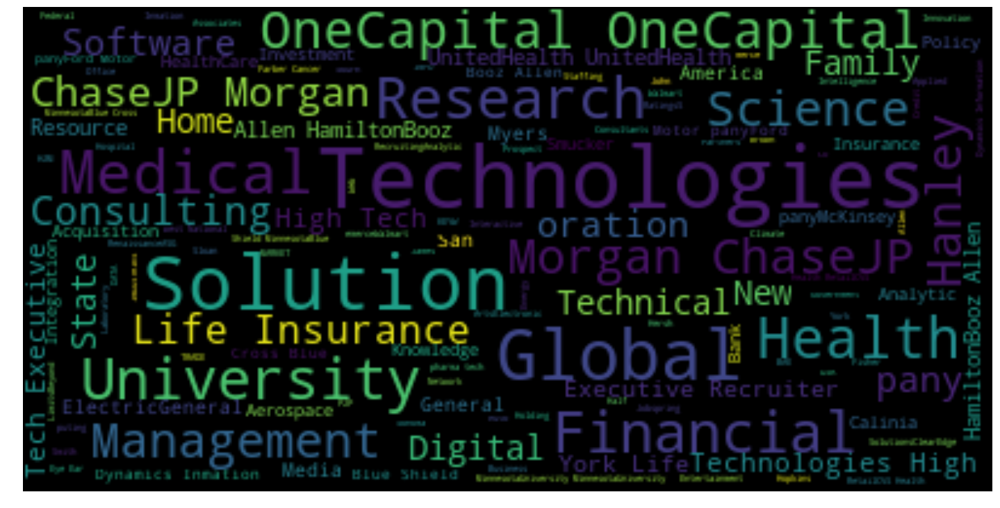

In [103]:
plt.figure(figsize=(25, 15))
plt.imshow(wcdscom, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [68]:
df_job_employer = df_jobs.groupby(['company']).title.count().sort_values(ascending=False).head(20)
df_job_employer

company
Amazon                      278
Capgemini                   172
UnitedHealth                143
Microsoft                   142
JP Morgan Chase             109
Diverse Lynx                 89
KPMG                         88
Lorven Technologies          81
Harnham                      73
DXC                          72
Jobspring Partners           72
Citi                         71
Apple                        70
Workbridge Associates        65
Facebook                     64
 Home Depot                  64
Google                       57
Capital One                  56
State Street                 52
Robert Half Technologies     44
Name: title, dtype: int64

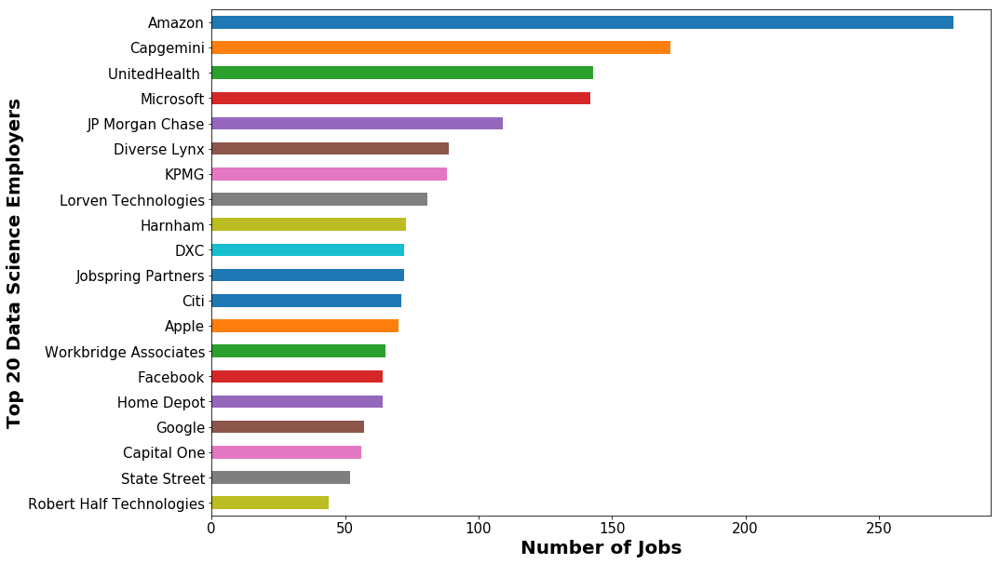

In [69]:
plt.rcParams['figure.figsize'] = (15,10)
ax = df_job_employer.plot.barh()
ax.invert_yaxis()
ax.set_xlabel('Number of Jobs', size = 20, fontweight='bold')
ax.set_ylabel("Top 20 Data Science Employers", size=20, fontweight='bold',)
plt.xticks(size = 15)
plt.yticks(size = 15)
plt.show()

In [ ]:
#creating frequency plots fro salary

In [70]:
statelist = ['AZ','CA', 'FL', 'GA', 'IL','IN', 'MA', 'MD', 'MI', 'MN', 'NC', 'NJ','NY', 'OH', 'PA', 'TX', 'VA', 'WA', 'WI']

In [71]:
df_job_plot = df_jobs.groupby(['state','job_category']).title.count().reset_index().pivot(index ='state', columns='job_category', values= 'title')
df_job_plot = df_job_plot.loc[statelist]
df_job_plot

job_category,Business Analyst,Data Analyst,Data Engineer,Data Scientist
state,,,,
AZ,220.0,87.0,30.0,28.0
CA,1009.0,934.0,689.0,998.0
FL,632.0,219.0,52.0,85.0
GA,508.0,163.0,71.0,104.0
IL,625.0,245.0,119.0,202.0
IN,97.0,44.0,10.0,24.0
MA,548.0,266.0,133.0,235.0
MD,306.0,177.0,50.0,111.0
MI,278.0,126.0,35.0,62.0


(array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
        17, 18]), <a list of 19 Text xticklabel objects>)

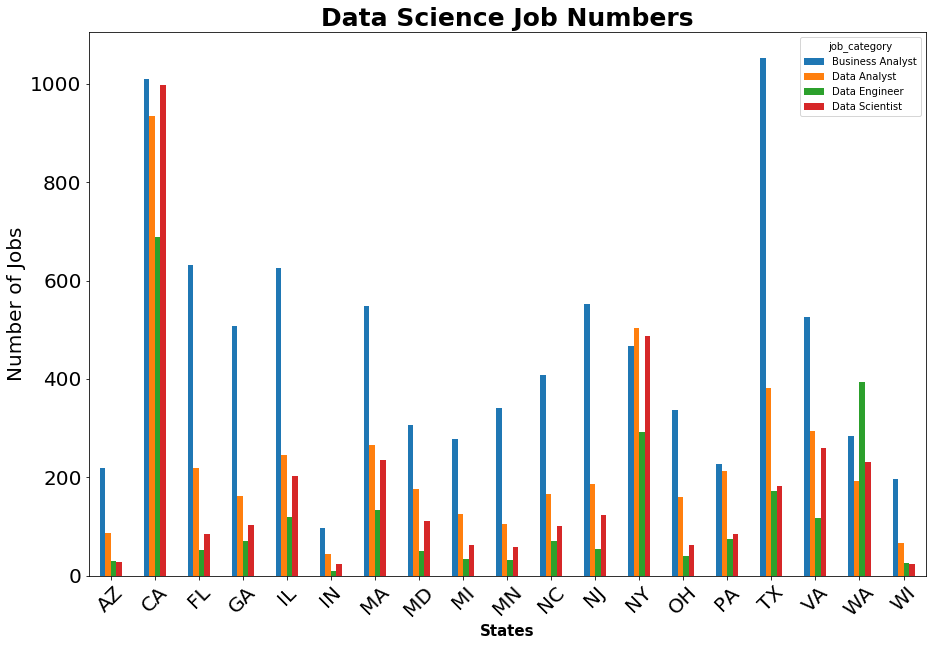

In [72]:
plt.rcParams['figure.figsize'] = (15,10)
df_job_plot.plot.bar(fontsize=20)
plt.title('Data Science Job Numbers', fontsize=25,fontweight='bold')
plt.xlabel('States',fontsize=15,fontweight='bold')
plt.ylabel('Number of Jobs',fontsize=20)
plt.savefig('#jobs statewide.png', dpi=300)
plt.xticks(rotation=45)

In [73]:
df_salary = pd.read_csv("Salary_combined_alldata.csv")

In [74]:
df_salary.head(10)

list(map(lambda newstr: float(newstr.replace("$", "").replace(",","").strip()), df_salary.salary_year))

df_salary ['$_year'] = list(map(lambda newstr: float(newstr.replace("$", "").replace(",","").strip()), df_salary.salary_year))

df_salary.head(10)

,title,Avg_salary,State,job_category,salary_year,$_year
0,"V Dart, Inc.",$65.00 per day,CA,Business Analyst,"$16,965.00",16965.00
1,Etonwood,$798 per day,CA,Business Analyst,"$208,278.00",208278.00
2,Kanand Corporation,$312 per day,CA,Business Analyst,"$81,432.00",81432.00
3,Cygnus Professionals Inc,$69.73 per day,CA,Business Analyst,"$18,199.53",18199.53
4,Greenlight Technical Consulting,$72.46 per day,CA,Business Analyst,"$18,912.06",18912.06
5,Xoriant Corporation,$501 per day,FL,Business Analyst,"$130,761.00",130761.00
6,"V Dart, Inc.",$130 per day,MA,Business Analyst,"$33,930.00",33930.00
7,"V Dart, Inc.",$120 per day,MD,Business Analyst,"$31,320.00",31320.00
8,Tekwissen,$69.88 per day,MI,Business Analyst,"$18,238.68",18238.68
9,"V Dart, Inc.",$90.00 per day,MI,Business Analyst,"$23,490.00",23490.00


In [75]:
#making df for each job category
df_salary_BA = df_salary.loc[df_salary['job_category'] == 'Business Analyst']
df_salary_DA = df_salary.loc[df_salary['job_category'] == 'Data Analyst']
df_salary_DE = df_salary.loc[df_salary['job_category'] == 'Data Engineer']
df_salary_DS = df_salary.loc[df_salary['job_category'] == 'Data Scientist']

In [76]:
df_salary_BA.head(10)

,title,Avg_salary,State,job_category,salary_year,$_year
0,"V Dart, Inc.",$65.00 per day,CA,Business Analyst,"$16,965.00",16965.00
1,Etonwood,$798 per day,CA,Business Analyst,"$208,278.00",208278.00
2,Kanand Corporation,$312 per day,CA,Business Analyst,"$81,432.00",81432.00
3,Cygnus Professionals Inc,$69.73 per day,CA,Business Analyst,"$18,199.53",18199.53
4,Greenlight Technical Consulting,$72.46 per day,CA,Business Analyst,"$18,912.06",18912.06
5,Xoriant Corporation,$501 per day,FL,Business Analyst,"$130,761.00",130761.00
6,"V Dart, Inc.",$130 per day,MA,Business Analyst,"$33,930.00",33930.00
7,"V Dart, Inc.",$120 per day,MD,Business Analyst,"$31,320.00",31320.00
8,Tekwissen,$69.88 per day,MI,Business Analyst,"$18,238.68",18238.68
9,"V Dart, Inc.",$90.00 per day,MI,Business Analyst,"$23,490.00",23490.00


Text(0,0.5,'Frequency')

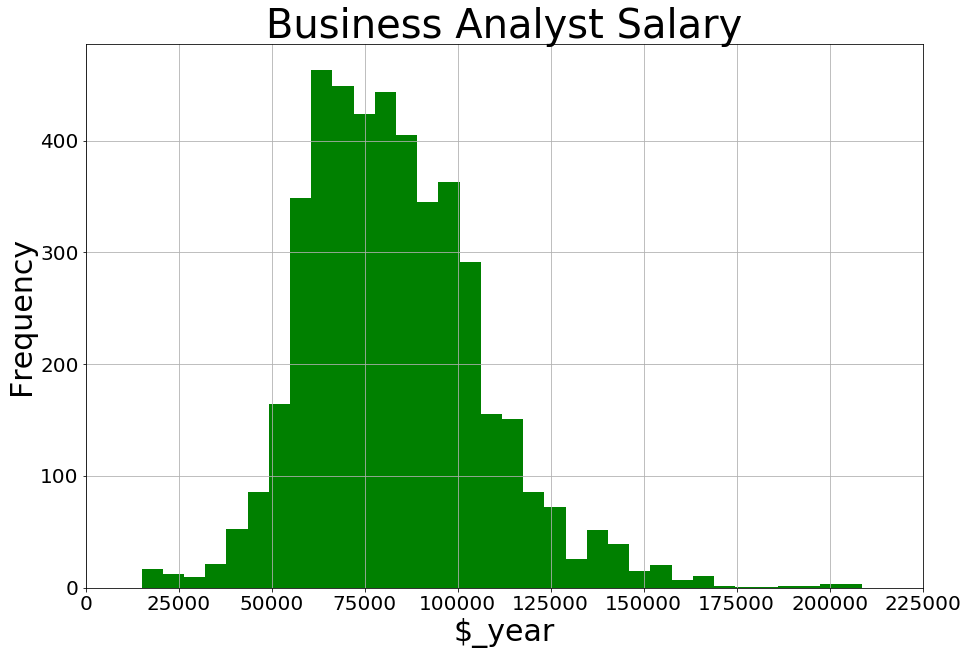

In [77]:
df_salary_BA['$_year'].hist(figsize = (15,10),bins=50, color= 'green')
plt.title("Business Analyst Salary",size = 40)
plt.xlim(xmin=0, xmax = 225000)
plt.xlabel("$_year",size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.ylabel("Frequency",size = 30)


Text(0,0.5,'Frequency')

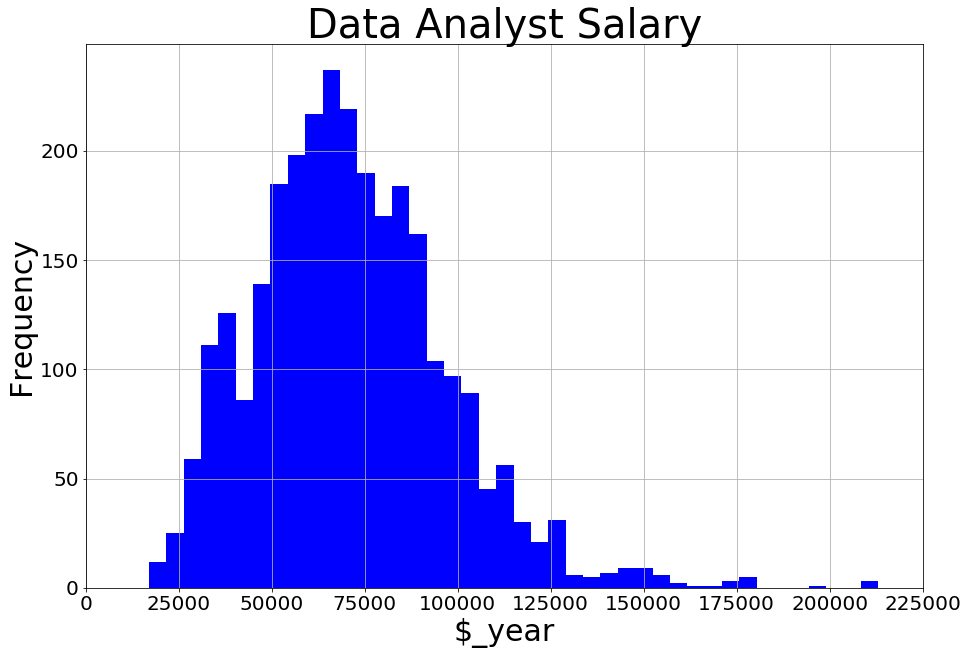

In [78]:
df_salary_DA['$_year'].hist(figsize = (15,10),bins=50, color= 'blue')
plt.title("Data Analyst Salary",size = 40)
plt.xlim(xmin=0, xmax = 225000)
plt.xlabel("$_year",size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.ylabel("Frequency",size = 30)

Text(0,0.5,'Frequency')

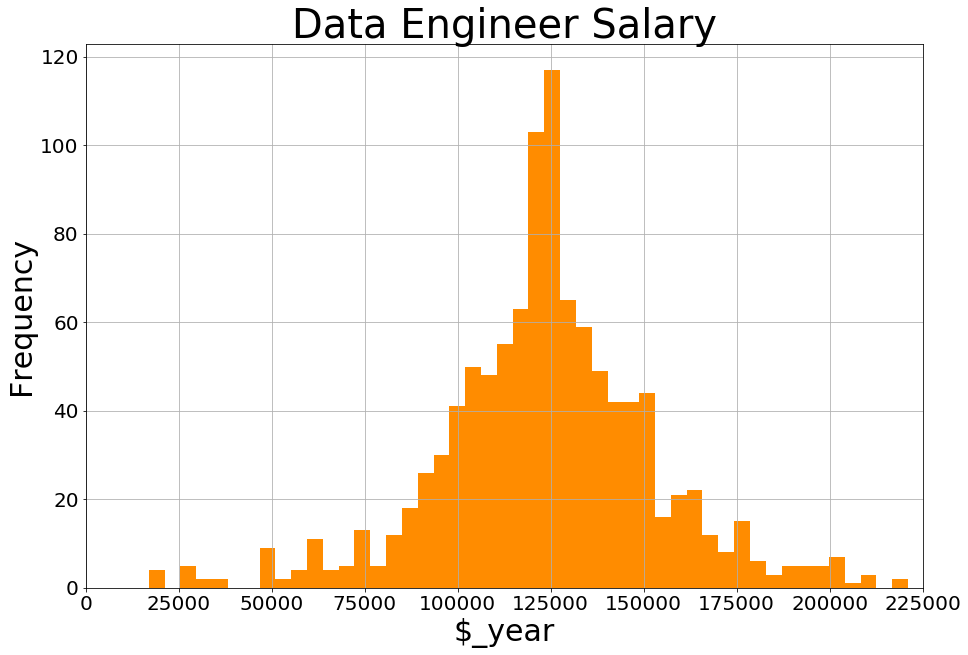

In [83]:
df_salary_DE['$_year'].hist(figsize = (15,10),bins=50, color= 'darkorange')
plt.title("Data Engineer Salary",size = 40)
plt.xlim(xmin=0, xmax = 225000)
plt.xlabel("$_year",size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.ylabel("Frequency",size = 30)

Text(0,0.5,'Frequency')

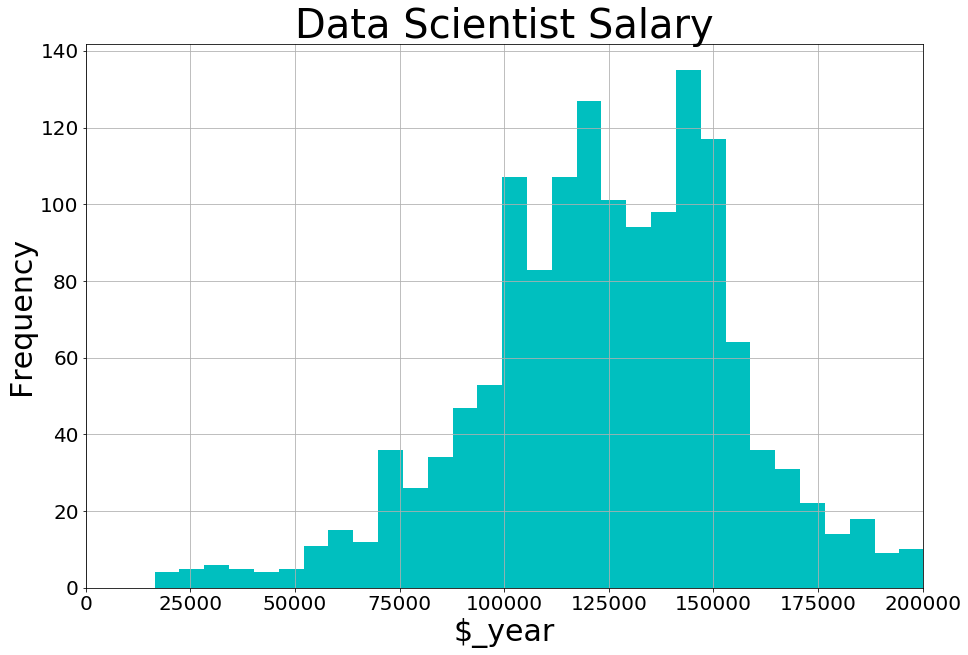

In [84]:
df_salary_DS['$_year'].hist(figsize = (15,10),bins=50, color= 'c')
plt.title("Data Scientist Salary",size = 40)
plt.xlim(xmin=0, xmax = 200000)
plt.xlabel("$_year",size = 30)
plt.xticks(size = 20)
plt.yticks(size = 20)
plt.ylabel("Frequency",size = 30)

In [ ]:
#plot 

In [85]:
df_salary_plot = df_salary.groupby('job_category')
df_salary_plot1 = df_salary_plot['$_year'].agg([np.mean,np.std])
df_salary_plot1

,mean,std
job_category,,
Business Analyst,83184.566761,24498.900903
Data Analyst,71321.593180,25989.293729
Data Engineer,124197.259869,30036.734595
Data Scientist,126476.147233,35293.012500


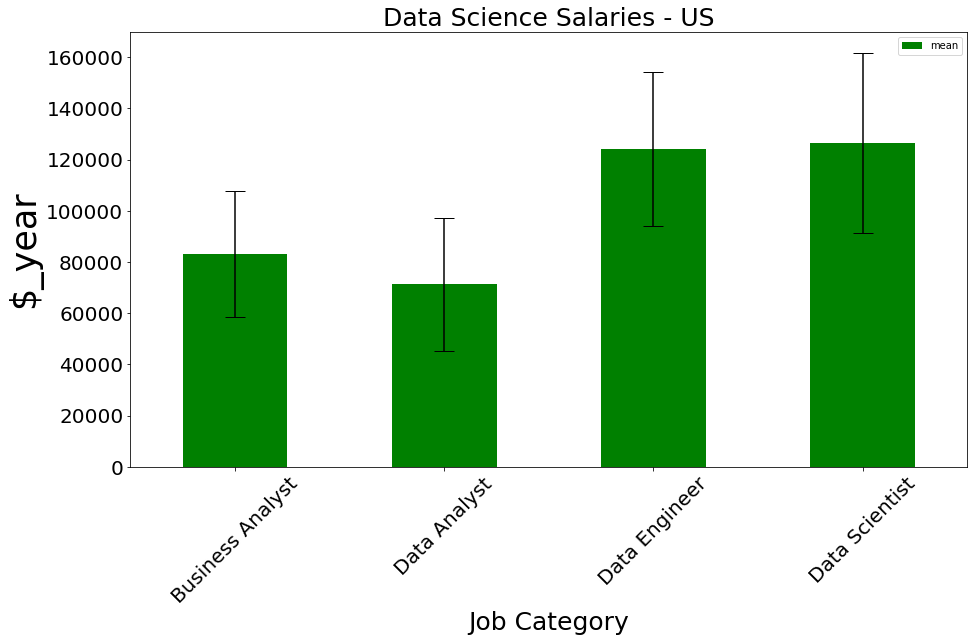

In [86]:
plt.rcParams['figure.figsize'] = (15,8)
df_salary_plot1.plot.bar(color='green', ecolor = 'black', yerr= 'std', capsize=10, fontsize=20)
plt.title('Data Science Salaries - US',fontsize=25)
plt.xlabel('Job Category',fontsize=25)
plt.ylabel('$_year', fontsize=35)
plt.xticks(rotation=45)
plt.savefig('DS Salaries_US.png', dpi=300)

In [87]:
df_salary_state = df_salary.groupby(['State','job_category'])
df_salary_state = df_salary_state['$_year'].agg([np.mean,np.std])
df_salary_state= df_salary_state.reset_index().pivot(index ='State', columns='job_category', values= ['mean','std'])

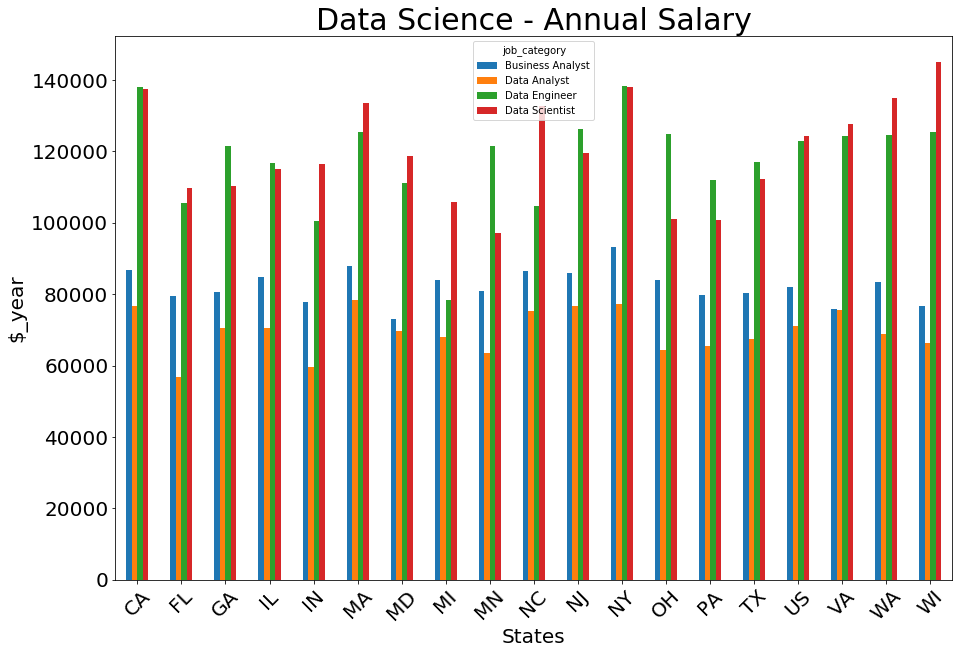

In [88]:
plt.rcParams['figure.figsize'] = (15,10)
df_salary_state['mean'].plot.bar(fontsize=20)
plt.title('Data Science - Annual Salary', fontsize=30)
plt.xlabel('States', fontsize=20)
plt.ylabel('$_year', fontsize=20)
plt.xticks(rotation=45)
plt.savefig('DS Salaries_Statewise.png', dpi=500)

In [ ]:
#Creating key words for cover letter using job summary

In [90]:
df_jobsummary_DA = df_jobs_DA.loc[~df_jobs_DA['summary'].isna()]
df_jobsummary_DE = df_jobs_DE.loc[~df_jobs_DE['summary'].isna()]
df_jobsummary_DS = df_jobs_DS.loc[~df_jobs_DS['summary'].isna()]

In [ ]:
#creating word cloud for Data Analyst job summary

In [91]:
wcdasummary = WordCloud(background_color="white", max_words=2000)
# generate word cloud
wcdasummary.generate(''.join(df_jobsummary_DA['summary']))

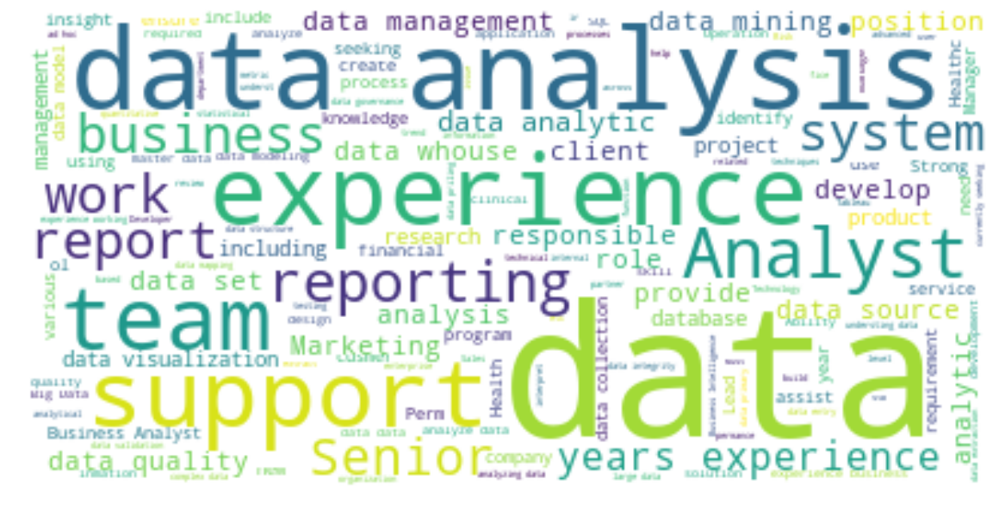

In [92]:
# show
plt.figure(figsize=(20, 15))
plt.imshow(wcdasummary, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [ ]:
#creating word cloud for Data Engineeer job summary

In [93]:
wcdssummary = WordCloud(background_color="white", max_words=2000)
# generate word cloud
wcdssummary.generate(''.join(df_jobsummary_DS['summary']))

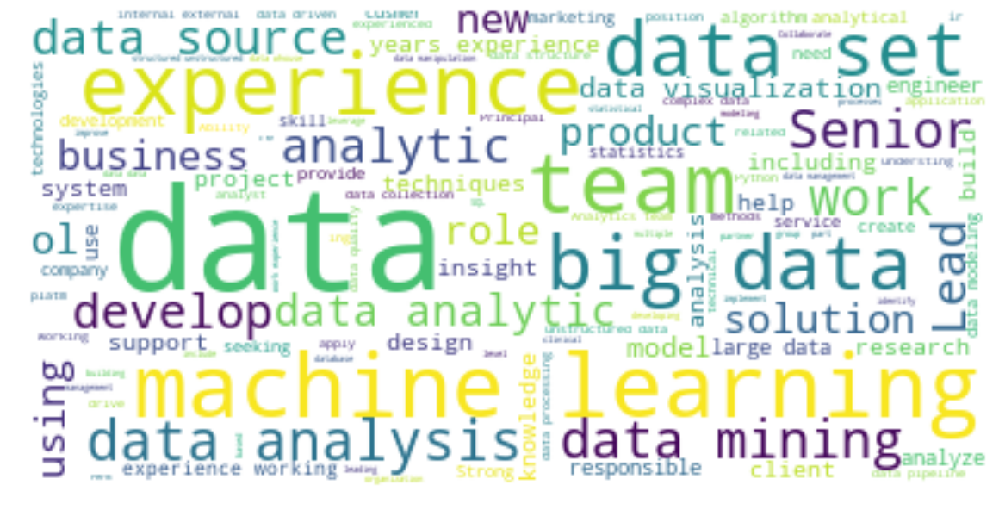

In [94]:
# show
plt.figure(figsize=(20, 15))
plt.imshow(wcdssummary, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [95]:
wcdesummary = WordCloud(background_color="white", max_words=2000,stopwords='Data Engineer')
# generate word cloud
wcdesummary.generate(''.join(df_jobsummary_DE['summary']))

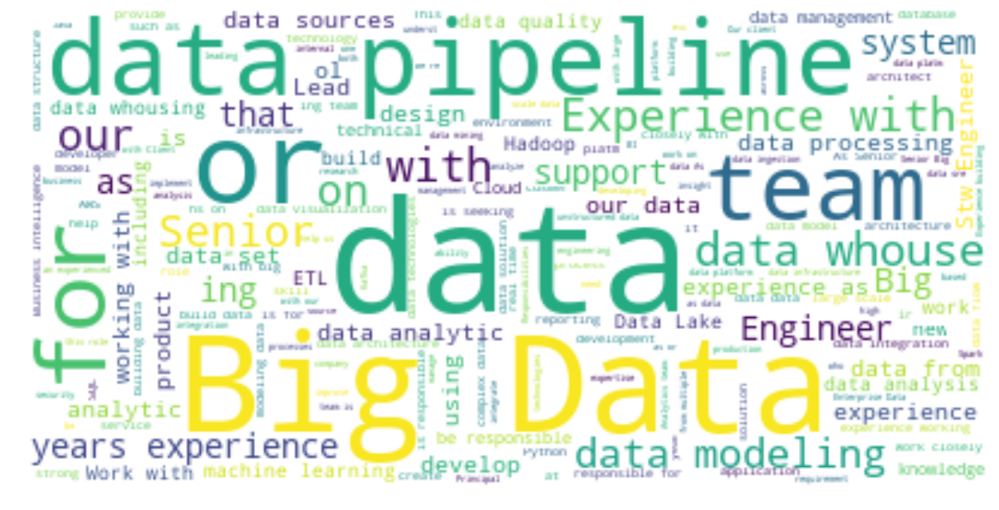

In [96]:
# show
plt.figure(figsize=(20, 15))
plt.imshow(wcdesummary, interpolation='bilinear')
plt.axis("off")
plt.axis("off")
plt.show()

In [ ]:
#Getting lis tof top 20 words from job description fo reach job category

In [ ]:
list(map(lambda s: s.split(', '), df_jobs_DS['experience'])) # converting the lis tin each row inot one nested list

In [ ]:
list_experience_DS = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_DS['experience']))))#unpacking the nested list

In [ ]:
cds = Counter(list_experience_DS)
cds3 = cds.most_common(20)
print(cds3)

In [ ]:
fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
ax.barh(list(map(lambda t:t[0],cds3)), list(map(lambda t:t[1],cds3)), color='magenta')
ax.invert_yaxis()
ax.set_xlabel('Frequency')
ax.set_title('Data Science Job Skills')
plt.show()
fig.savefig('DS_skils.png', dpi=500)

In [ ]:
list(map(lambda s: s.split(', '), df_jobs_DS['experience'])) # converting the lis tin each row inot one nested list

list_experience_DS = list(chain.from_iterable(list(map(lambda s: s.split(', '), df_jobs_DS['experience']))))#unpacking the nested list

cds = Counter(list_experience_DS)
cds3 = cds.most_common(20)
print(cds3)

fig, ax = plt.subplots(figsize=(10, 8),dpi=300)
ax.barh(list(map(lambda t:t[0],cds3)), list(map(lambda t:t[1],cds3)), color='magenta')
ax.invert_yaxis()
ax.set_xlabel('Frequency')
ax.set_title('Data Science Job Skills')
plt.show()
fig.savefig('DS_skils.png', dpi=500)